In [1]:
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from IPython.display import Audio

In [2]:
data_path = "results"

In [3]:
results_dfs = {
    "whisper_tiny": pd.read_parquet(os.path.join(data_path, "whisper_tiny_results_df.parquet")),
    "whisper_small": pd.read_parquet(os.path.join(data_path, "whisper_small_results_df.parquet")),
    # "whisper_base": pd.read_parquet(os.path.join(data_path, "whisper_base_results_df.parquet")),
    "whisper_medium": pd.read_parquet(os.path.join(data_path, "whisper_medium_results_df.parquet")),
    "whisper_large_v3": pd.read_parquet(os.path.join(data_path, "whisper_large-v3_results_df.parquet")),
    "dist_whisper_large_v3": pd.read_parquet(os.path.join(data_path, "primeline_distil_whisper_large_v3_german_results_df.parquet")),
    "whisperx_large_v3": pd.read_parquet(os.path.join(data_path, "whisperx_results_df.parquet")),
    "wav2vec": pd.read_parquet(os.path.join(data_path, "wav2vec_results_df.parquet")),
}

metrics_dfs = {
    "whisper_tiny": pd.read_parquet(os.path.join(data_path, "whisper_tiny_metrics_df.parquet")),
    "whisper_small": pd.read_parquet(os.path.join(data_path, "whisper_small_metrics_df.parquet")),
    # "whisper_base": pd.read_parquet(os.path.join(data_path, "whisper_base_metrics_df.parquet")),
    "whisper_medium": pd.read_parquet(os.path.join(data_path, "whisper_medium_metrics_df.parquet")),
    "whisper_large_v3": pd.read_parquet(os.path.join(data_path, "whisper_large-v3_metrics_df.parquet")),
    "dist_whisper_large_v3": pd.read_parquet(os.path.join(data_path, "primeline_distil_whisper_large_v3_german_metrics_df.parquet")),
    "whisperx_large_v3": pd.read_parquet(os.path.join(data_path, "whisperx_metrics_df.parquet")),
    "wav2vec": pd.read_parquet(os.path.join(data_path, "wav2vec_metrics_df.parquet")),
}

metrics_dfs = pd.DataFrame({
    "Model": list(metrics_dfs.keys()),
    "WER": [df["wer"].values[0] for df in metrics_dfs.values()],
    "CER": [df["cer"].values[0] for df in metrics_dfs.values()],
    "WIL": [df["wil"].values[0] for df in metrics_dfs.values()],
    "WIP": [df["wip"].values[0] for df in metrics_dfs.values()],
    "ED": [df["ed"].values[0] for df in metrics_dfs.values()],
    "mean_inference_time": [df["mean_inference_time"].values[0] for df in metrics_dfs.values()],
    "sum_inference_time": [df["sum_inference_time"].values[0] for df in metrics_dfs.values()],
})

data_df = pd.read_parquet(os.path.join(data_path, "yt_df_filtered.parquet"))

data_df.head(3)

,video_id,video_path,video_url,segment_path,transcript_path,segment_duration,transcript,num_words
0,u1upVtXcrdo,F:/BIG_FILES/AI_DATA/2024_STT\u1upVtXcrdo,https://www.youtube.com/watch?v=u1upVtXcrdo,F:/BIG_FILES/AI_DATA/2024_STT\u1upVtXcrdo\segm...,F:/BIG_FILES/AI_DATA/2024_STT\u1upVtXcrdo\tran...,24.070,"So sieht jetzt mein Make-up aus, ich bin jetzt...",41
1,5EkeDBfYimI,F:/BIG_FILES/AI_DATA/2024_STT\5EkeDBfYimI,https://www.youtube.com/watch?v=5EkeDBfYimI,F:/BIG_FILES/AI_DATA/2024_STT\5EkeDBfYimI\segm...,F:/BIG_FILES/AI_DATA/2024_STT\5EkeDBfYimI\tran...,19.101,"Ziel. Wie genau wir dahin kommen, ist mir egal...",54
2,FRuyzfNw-i8,F:/BIG_FILES/AI_DATA/2024_STT\FRuyzfNw-i8,https://www.youtube.com/watch?v=FRuyzfNw-i8,F:/BIG_FILES/AI_DATA/2024_STT\FRuyzfNw-i8\segm...,F:/BIG_FILES/AI_DATA/2024_STT\FRuyzfNw-i8\tran...,20.360,Das sind manchmal ganz verrückte Momente. Also...,79


In [4]:
# print some stats
print(f"Amount of data: {len(data_df)}")
print(f"Total length of audio: {data_df['segment_duration'].sum() / 3600:.2f} hours")
print(f"Total number of words: {data_df['num_words'].sum()}")

sample_audio = data_df.sample(1)
sample_transcript = sample_audio["transcript"].values[0]
sample_audio_path = sample_audio["segment_path"].values[0]
print(f"Sample transcript: {sample_transcript}")
display(Audio(sample_audio_path))

Amount of data: 11839
Total length of audio: 68.59 hours
Total number of words: 612397
Sample transcript: Was allein zählt ist die Ehre der Familie und das Wort Mahmouds, wie er selbst sagt. Und das nicht nur im eigenen, sondern auch bei anderen Clans. So wie den Abou-Chakers oder Remmos, mit denen sie sich die Straße teilen. Dass die Polizei dabei oftmals wenig mitzureden hat, merkt sie leider auch schnell selbst.


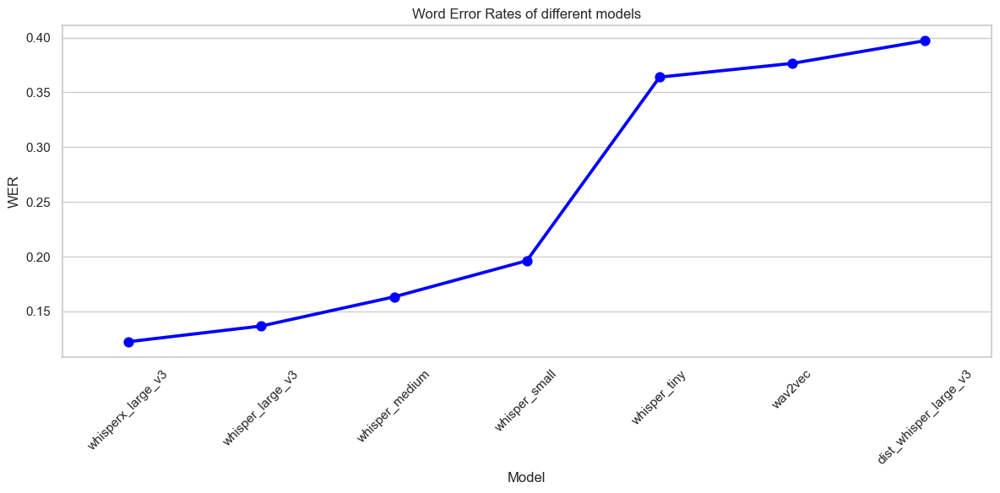

In [5]:
wers_df = metrics_dfs.sort_values("WER")

plt.figure(figsize=(12, 6)); sns.set_theme(style="whitegrid")
sns.pointplot(data=wers_df, x="Model", y="WER", color="blue")
plt.xticks(rotation=45)
plt.title("Word Error Rates of different models")
plt.tight_layout()
plt.show()

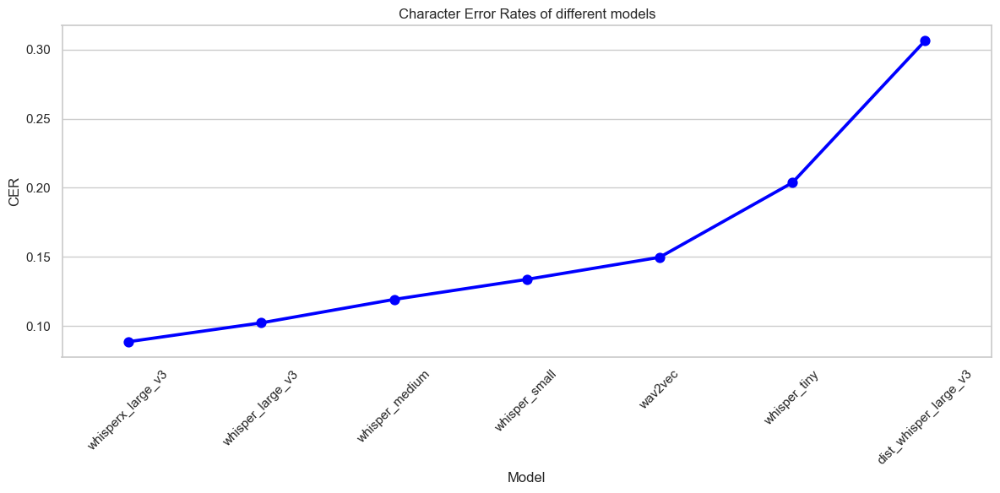

In [8]:
cers_df = metrics_dfs.sort_values("CER")

plt.figure(figsize=(12, 6)); sns.set_theme(style="whitegrid")
sns.pointplot(data=cers_df, x="Model", y="CER", color="blue")   
plt.xticks(rotation=45)
plt.title("Character Error Rates of different models")
plt.tight_layout()
plt.show()

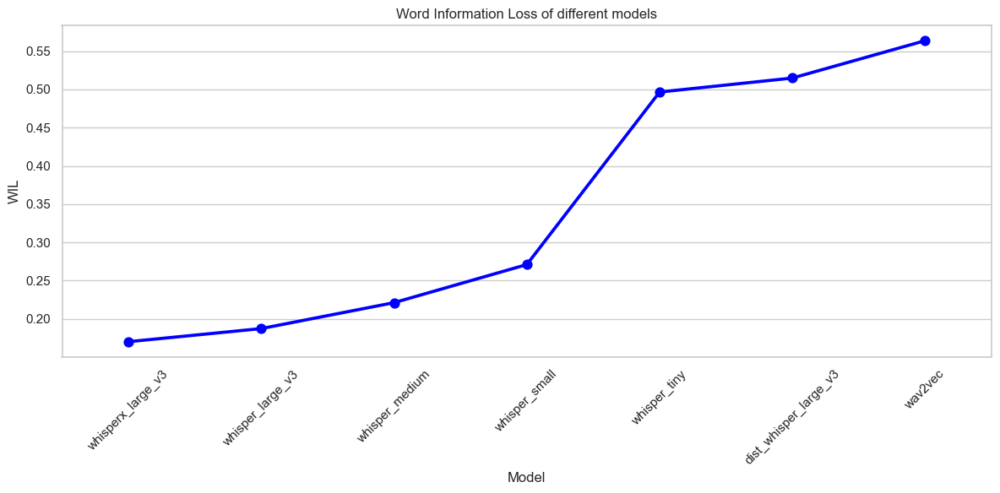

In [9]:
wils_df = metrics_dfs.sort_values("WIL")

plt.figure(figsize=(12, 6)); sns.set_theme(style="whitegrid")
sns.pointplot(data=wils_df, x="Model", y="WIL", color="blue")
plt.xticks(rotation=45)
plt.title("Word Information Loss of different models")
plt.tight_layout()
plt.show()

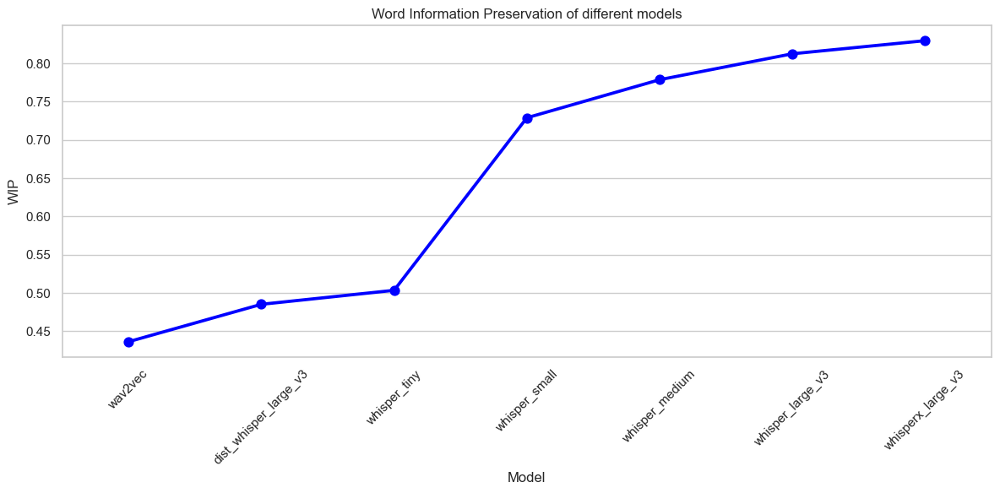

In [10]:
wips_df = metrics_dfs.sort_values("WIP")

plt.figure(figsize=(12, 6)); sns.set_theme(style="whitegrid")
sns.pointplot(data=wips_df, x="Model", y="WIP", color="blue")
plt.xticks(rotation=45)
plt.title("Word Information Preservation of different models")
plt.tight_layout()
plt.show()

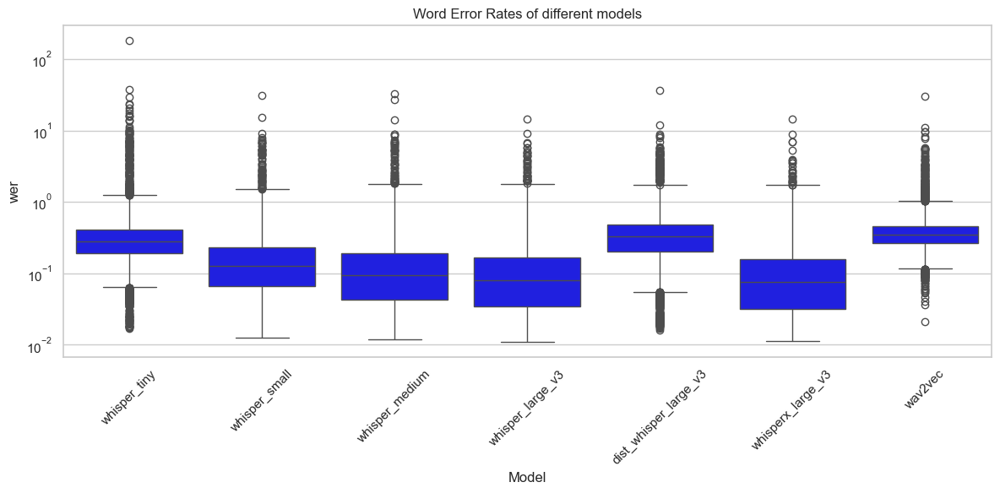

In [11]:
# Concatenate all WER values into a single array
wer_values = np.concatenate([df["wer"].values for df in results_dfs.values()])

# Create a DataFrame with flattened WER values
sample_wers_df = pd.DataFrame({
    "Model": np.repeat(list(results_dfs.keys()), [len(df) for df in results_dfs.values()]),
    "wer": wer_values,
})

# Plot boxplot
plt.figure(figsize=(12, 6))
sns.set_theme(style="whitegrid")
sns.boxplot(data=sample_wers_df, x="Model", y="wer", color="blue", log_scale=True)
plt.xticks(rotation=45)
plt.title("Word Error Rates of different models")
plt.tight_layout()
plt.show()

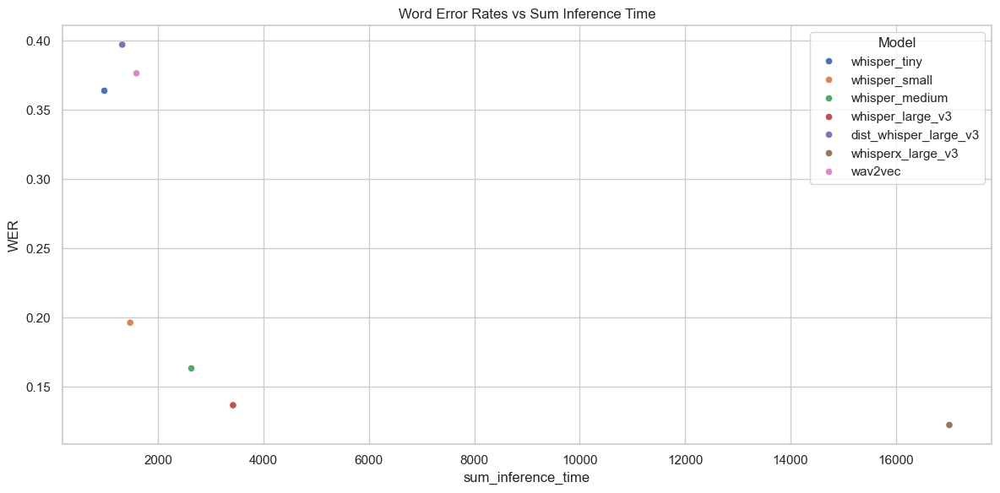

In [6]:
# plot wer vs mean inference time
plt.figure(figsize=(12, 6))
sns.set_theme(style="whitegrid")
sns.scatterplot(data=metrics_dfs, x="sum_inference_time", y="WER", color="blue", hue="Model")
plt.title("Word Error Rates vs Sum Inference Time")
plt.tight_layout()
plt.show()

In [7]:
for model, df in results_dfs.items():
    best_sample = df.sort_values("wer").iloc[0]
    print(f"Best sample for {model}:")
    print("-" * 30)
    print(f"Audio path: {best_sample['audio_path']}")
    display(Audio(best_sample["audio_path"]))
    print("-" * 30)
    print(f"Ground truth:            {best_sample['gt']}")
    print(f"Prediction:              {best_sample['decoded_output']}")
    print("-" * 30)
    print(f"Normalized ground truth: {best_sample['normalized_gt']}")
    print(f"Normalized prediction:   {best_sample['normalized_decoded_output']}")
    print("-" * 30)
    print(f"WER: {best_sample['wer']}")
    print(); print(); print()

Best sample for whisper_tiny:
------------------------------
Audio path: F:/BIG_FILES/AI_DATA/2024_STT\2Go4Npf1hYU\segments\segment_02.mp3


------------------------------
Ground truth:            (Dramatische Musik)
Prediction:              Ich bin aus der Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-Mischin-
--

------------------------------
Ground truth:            (Dramatische Musik)
Prediction:              Wir sind am Herbst, am Sack, und der Porteiro war der Tag, der uns um uns gekommen ist. Er sagte, das ist ein Partner der Isabelle. Wir haben uns gespielt. Mein Vater sagte, er sollte nie wiederkommen. Das war ein sehr guter Platz.
------------------------------
Normalized ground truth: 
Normalized prediction:   wir sind am herbst am sack und der porteiro war der tag der uns um uns gekommen ist er sagte das ist ein partner der isabelle wir haben uns gespielt mein vater sagte er sollte nie wiederkommen das war ein sehr guter platz
------------------------------
WER: -1.0



Best sample for whisper_medium:
------------------------------
Audio path: F:/BIG_FILES/AI_DATA/2024_STT\v_BZFf-ttA0\segments\segment_14.mp3


------------------------------
Ground truth:            (Dramatische Musik)
Prediction:              Wir sind am Sábado in ihr Gebiet gekommen. Der Torhüter hat uns gesagt, wir seien die Eltern von Isabella. Wir haben gesungen. Mein Vater hat gesagt, dass sie nie wiederkommen sollte. Das hat mich sehr geholfen.
------------------------------
Normalized ground truth: 
Normalized prediction:   wir sind am s bado in ihr gebiet gekommen der torhueter hat uns gesagt wir seien die eltern von isabella wir haben gesungen mein vater hat gesagt dass sie nie wiederkommen sollte das hat mich sehr geholfen
------------------------------
WER: -1.0



Best sample for whisper_large_v3:
------------------------------
Audio path: F:/BIG_FILES/AI_DATA/2024_STT\siw5LYptzqE\segments\segment_12.mp3


------------------------------
Ground truth:            (Nachdenkliche Klänge)
Prediction:              an einem Ort, wo es sonst Gletscher hatte, nicht mehr gewesen ist. Und dann kommt man dort zurück, schlägt es einem schon aufs Gemüt, wenn man sieht, wie schnell sich das ändert, wie dramatisch sich das ändert. Und man weiss einfach, man kann es nicht aufhalten. Das schlägt schon teilweise aufs Gemüt, ja.
------------------------------
Normalized ground truth: 
Normalized prediction:   an einem ort wo es sonst gletscher hatte nicht mehr gewesen ist und dann kommt man dort zurueck schlaegt es einem schon aufs gemuet wenn man sieht wie schnell sich das aendert wie dramatisch sich das aendert und man weiss einfach man kann es nicht aufhalten das schlaegt schon teilweise aufs gemuet ja
------------------------------
WER: -1.0



Best sample for dist_whisper_large_v3:
------------------------------
Audio path: F:/BIG_FILES/AI_DATA/2024_STT\v_BZFf-ttA0\segments\segment_08.mp3


------------------------------
Ground truth:            (Unheilvolle Musik)
Prediction:              ,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
------------------------------
Normalized ground truth: 
Normalized prediction:   
------------------------------
WER: -1.0



Best sample for whisperx_large_v3:
------------------------------
Audio path: F:/BIG_FILES/AI_DATA/2024_ST

------------------------------
Ground truth:            (Ernste Musik) (Düstere Musik, heller Glockenton)
Prediction:              Outro
------------------------------
Normalized ground truth: 
Normalized prediction:   outro
------------------------------
WER: -1.0



Best sample for wav2vec:
------------------------------
Audio path: F:/BIG_FILES/AI_DATA/2024_STT\siw5LYptzqE\segments\segment_12.mp3


------------------------------
Ground truth:            (Nachdenkliche Klänge)
Prediction:              an einem an einem ort was sonst gletscher hater nicht mehr gewesen ist und dan komandol zurück schleigt seinem schon aufs gemüt wen man sieht wie wie schnel sich das ändert wie wie wie dramatisch sich das ender den wanmeiserwache man kans nicht aufhalten das ist schon sehr shleigt schon teilweise aufs gemüt an
------------------------------
Normalized ground truth: 
Normalized prediction:   an einem an einem ort was sonst gletscher hater nicht mehr gewesen ist und dan komandol zurueck schleigt seinem schon aufs gemuet wen man sieht wie wie schnel sich das aendert wie wie wie dramatisch sich das ender den wanmeiserwache man kans nicht aufhalten das ist schon sehr shleigt schon teilweise aufs gemuet an
------------------------------
WER: -1.0





In [11]:
for model, df in results_dfs.items():
    worst_sample = df.sort_values("wer").iloc[-1]
    print(f"Worst sample for {model}:")
    print("-" * 30)
    print(f"Audio path: {worst_sample['audio_path']}")
    display(Audio(worst_sample['audio_path']))
    print("-" * 30)
    print(f"Ground truth:            {worst_sample['gt']}")
    print(f"Prediction:              {worst_sample['decoded_output']}")
    print("-" * 30)
    print(f"Normalized ground truth: {worst_sample['normalized_gt']}")
    print(f"Normalized prediction:   {worst_sample['normalized_decoded_output']}")
    print("-" * 30)
    print(f"WER: {worst_sample['wer']}")
    print(); print(); print()

Worst sample for whisper_tiny:
------------------------------
Audio path: F:/BIG_FILES/AI_DATA/2024_STT\NlNK75eOmks\segments\segment_26.mp3


------------------------------
Ground truth:            Oder?
Prediction:              Oder? Ich habe die Kabette, die das in der Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von Ressentung von 

------------------------------
Ground truth:            Oder?
Prediction:              Ich habe hier ein Kaviert, das aus Russland ist, dass es in Russland gibt. Sobald solche Marken existieren, gibt es in Russland. Es gibt Rests. Wir müssen das russische Wachstum revisen.
------------------------------
Normalized ground truth: oder
Normalized prediction:   ich habe hier ein kaviert das aus russland ist dass es in russland gibt sobald solche marken existieren gibt es in russland es gibt rests wir muessen das russische wachstum revisen
------------------------------
WER: 31.0



Worst sample for whisper_medium:
------------------------------
Audio path: F:/BIG_FILES/AI_DATA/2024_STT\NlNK75eOmks\segments\segment_26.mp3


------------------------------
Ground truth:            Oder?
Prediction:              Ich würde noch ein Kaviar geben, dass es in der letzten Zeit etwas aus Russland war, aufgrund dessen, wie es jetzt in Russland existiert, Arresten gab. Wir müssen also die Rationale WIKI aufregen.
------------------------------
Normalized ground truth: oder
Normalized prediction:   ich wuerde noch ein kaviar geben dass es in der letzten zeit etwas aus russland war aufgrund dessen wie es jetzt in russland existiert arresten gab wir muessen also die rationale wiki aufregen
------------------------------
WER: 33.0



Worst sample for whisper_large_v3:
------------------------------
Audio path: F:/BIG_FILES/AI_DATA/2024_STT\o8IvGZu7YEE\segments\segment_13.mp3


------------------------------
Ground truth:            Wäre es nicht besser aufzugeben?
Prediction:              Sie meinen nicht, dass es nicht besser ist, aufzugeben? Aufgeben auf keinen Fall. Ich kann nicht konkret sagen, wie das dann abläuft. Dann knallt es da drin und vor allem mein Kumpel ist brandgefährlich. Und das Letzte ist dann diesen, ja, ich habe elf Jahre Knastweg, ich habe 13 gehabt. Ich war von Anfang an Erziehungshalber und so eine Scheiße und alles. Und ich scheiße auf mein Leben. Und das mache ich ganz im Ernst. Ja.
------------------------------
Normalized ground truth: waere es nicht besser aufzugeben
Normalized prediction:   sie meinen nicht dass es nicht besser ist aufzugeben aufgeben auf keinen fall ich kann nicht konkret sagen wie das dann ablaeuft dann knallt es da drin und vor allem mein kumpel ist brandgefaehrlich und das letzte ist dann diesen ja ich habe elf jahre knastweg ich habe dreizehn gehabt ich war von anfang an erziehungshalber und so eine scheiss

------------------------------
Ground truth:            Oder?
Prediction:              Ihr gehört eine Kaviar,,, dass es gibt,,, dass es ein rezent News kommen aus Rusa, according zu welcherlich solche,,, also auch seitdem auch existiert, dass in Riese, Inche, die haben auch Resslich ihre Resslich ihre Razzia.
------------------------------
Normalized ground truth: oder
Normalized prediction:   ihr gehoert eine kaviar  dass es gibt  dass es ein rezent news kommen aus rusa according zu welcherlich solche  also auch seitdem auch existiert dass in riese inche die haben auch resslich ihre resslich ihre razzia
------------------------------
WER: 36.0



Worst sample for wav2vec:
------------------------------
Audio path: F:/BIG_FILES/AI_DATA/2024_STT\NlNK75eOmks\segments\segment_26.mp3


------------------------------
Ground truth:            Oder?
Prediction:              oder aider kavietel da the hasben zam resent news kan auto rusher akolit wichakrsuch markex nau exist adrise rasha her bina wests h ähm the unmitehar tu revisen dat rational weakyon
------------------------------
Normalized ground truth: oder
Normalized prediction:   oder aider kavietel da the hasben zam resent news kan auto rusher akolit wichakrsuch markex nau exist adrise rasha her bina wests h aehm the unmitehar tu revisen dat rational weakyon
------------------------------
WER: 30.0





In [12]:
sample_id = results_dfs["whisper_tiny"].sample(1).index
for model, df in results_dfs.items():
    sample = df.loc[sample_id]
    print(f"Sample for {model}:")
    print("-" * 30)
    print(f"Audio path: {sample['audio_path'].values[0]}")
    display(Audio(sample['audio_path'].values[0]))
    print("-" * 30)
    print(f"Ground truth:            {sample['gt'].values[0]}")
    print(f"Prediction:              {sample['decoded_output'].values[0]}")
    print("-" * 30)
    print(f"Normalized ground truth: {sample['normalized_gt'].values[0]}")
    print(f"Normalized prediction:   {sample['normalized_decoded_output'].values[0]}")
    print("-" * 30)
    print(f"WER: {sample['wer'].values[0]}")
    print(); print(); print()

Sample for whisper_tiny:
------------------------------
Audio path: F:/BIG_FILES/AI_DATA/2024_STT\SFxRvohLtrk\segments\segment_09.mp3


------------------------------
Ground truth:            Geld rein. Der Staat kann aber dafür sorgen, dass mehr Leute Arbeit haben, indem er investiert. Investiert man zum Beispiel in eine funktionierende Infrastruktur, dann verpufft das ja nicht einfach. Ein einfaches Beispiel: Wenn der Staat Geld einsetzt, vielleicht sogar Schulden macht, um eine Brücke bauen zu lassen, dann fließt Geld für das Material, Leute verdienen Geld mit der Planung und auf der Baustelle. Auf
Prediction:              Die Startkinderbitter versorgen, dass mehr Leute arbeiten, indem er investiert. Ein einfaches Beispiel. Wenn der Start Geld einsetzt, vielleicht sogar Schulden macht, um eine Brümgebauen zu lassen, dann fließt Geld für das Material, Leute für den Geld mit der Planung und auf der Baustell.
------------------------------
Normalized ground truth: geld rein der staat kann aber dafuer sorgen dass mehr leute arbeit haben indem er investiert investiert man zum beispiel in eine funktionierende infrastrukt

------------------------------
Ground truth:            Geld rein. Der Staat kann aber dafür sorgen, dass mehr Leute Arbeit haben, indem er investiert. Investiert man zum Beispiel in eine funktionierende Infrastruktur, dann verpufft das ja nicht einfach. Ein einfaches Beispiel: Wenn der Staat Geld einsetzt, vielleicht sogar Schulden macht, um eine Brücke bauen zu lassen, dann fließt Geld für das Material, Leute verdienen Geld mit der Planung und auf der Baustelle. Auf
Prediction:              Der Staat kann aber dafür sorgen, dass mehr Leute Arbeit haben, indem er investiert. Ein einfaches Beispiel. Wenn der Staat Geld einsetzt, vielleicht sogar Schulden macht, um eine Brücke bauen zu lassen, dann fließt Geld für das Material, Leute verdienen Geld mit der Planung und auf der Baustelle.
------------------------------
Normalized ground truth: geld rein der staat kann aber dafuer sorgen dass mehr leute arbeit haben indem er investiert investiert man zum beispiel in eine funktionierende in

------------------------------
Ground truth:            Geld rein. Der Staat kann aber dafür sorgen, dass mehr Leute Arbeit haben, indem er investiert. Investiert man zum Beispiel in eine funktionierende Infrastruktur, dann verpufft das ja nicht einfach. Ein einfaches Beispiel: Wenn der Staat Geld einsetzt, vielleicht sogar Schulden macht, um eine Brücke bauen zu lassen, dann fließt Geld für das Material, Leute verdienen Geld mit der Planung und auf der Baustelle. Auf
Prediction:              Der Staat kann dafür sorgen, dass mehr Leute Arbeit haben, indem er investiert. Investiert man zum Beispiel in eine funktionierende Infrastruktur, dann verpufft das ja nicht einfach. Ein einfaches Beispiel. Wenn der Staat Geld einsetzt, vielleicht sogar Schulden macht, um eine Brücke bauen zu lassen, dann fließt Geld für das Material, Leute verdienen Geld mit der Planung und auf der Baustelle.
------------------------------
Normalized ground truth: geld rein der staat kann aber dafuer sorgen dass 

------------------------------
Ground truth:            Geld rein. Der Staat kann aber dafür sorgen, dass mehr Leute Arbeit haben, indem er investiert. Investiert man zum Beispiel in eine funktionierende Infrastruktur, dann verpufft das ja nicht einfach. Ein einfaches Beispiel: Wenn der Staat Geld einsetzt, vielleicht sogar Schulden macht, um eine Brücke bauen zu lassen, dann fließt Geld für das Material, Leute verdienen Geld mit der Planung und auf der Baustelle. Auf
Prediction:              Geld rein. Der Staat kann aber dafür sorgen, dass mehr Leute Arbeit haben, indem er investiert. Ein einfaches Beispiel. Wenn der Staat Geld einsetzt, vielleicht sogar Schulden macht, um eine Brücke bauen zu lassen, dann fließt Geld für das Material, Leute verdienen Geld mit der Planung und auf der Baustelle.
------------------------------
Normalized ground truth: geld rein der staat kann aber dafuer sorgen dass mehr leute arbeit haben indem er investiert investiert man zum beispiel in eine funktio

------------------------------
Ground truth:            Geld rein. Der Staat kann aber dafür sorgen, dass mehr Leute Arbeit haben, indem er investiert. Investiert man zum Beispiel in eine funktionierende Infrastruktur, dann verpufft das ja nicht einfach. Ein einfaches Beispiel: Wenn der Staat Geld einsetzt, vielleicht sogar Schulden macht, um eine Brücke bauen zu lassen, dann fließt Geld für das Material, Leute verdienen Geld mit der Planung und auf der Baustelle. Auf
Prediction:              Dieser Geld rein. Der Staat kann aber dafür sorgen, dass mehr Leute Arbeit haben, indem er investiert man zum Beispiel in eine funktionierende Infrastruktur, dann verpufft das ja nicht einfach. Ein einfaches Beispiel Wenn der Staat Geld Geld Geld einsetzt, vielleicht sogar Schulden macht, um eine Brücke bauen zu lassen. Dann fliest Geld für das Material, dann fliesst Geld für das Material, Leute für das Material, Leute für das Material, Leute für das Material, Leute verdienen und auf der Planung u

------------------------------
Ground truth:            Geld rein. Der Staat kann aber dafür sorgen, dass mehr Leute Arbeit haben, indem er investiert. Investiert man zum Beispiel in eine funktionierende Infrastruktur, dann verpufft das ja nicht einfach. Ein einfaches Beispiel: Wenn der Staat Geld einsetzt, vielleicht sogar Schulden macht, um eine Brücke bauen zu lassen, dann fließt Geld für das Material, Leute verdienen Geld mit der Planung und auf der Baustelle. Auf
Prediction:              eld rein der stat kan aber dafür sorgen das mehr leute arbeit haben indem er investiert investiert man zum beispiel in eine funktionierende infrastruktur dan verpuft das ja nicht einfach ein einfaches beispiel wen der stat geld einsetzt vieleicht sogar schuldenmacht um eine brücke bauen zu lasen dan fliest geld für das material leute verdienen geld mit der planung und auf der baustele
------------------------------
Normalized ground truth: geld rein der staat kann aber dafuer sorgen dass mehr leut

In [13]:
# why is distil whisper so bad? lets look at examples
distil_whisper_df = results_dfs["dist_whisper_large_v3"]
distil_whisper_samples = distil_whisper_df.sample(5)
for idx, sample in distil_whisper_samples.iterrows():
    print(f"Sample {idx}:")
    print("-" * 30)
    print(f"Audio path: {sample['audio_path']}")
    display(Audio(sample['audio_path']))
    print("-" * 30)
    print(f"Ground truth:            {sample['gt']}")
    print(f"Prediction:              {sample['decoded_output']}")
    print("-" * 30)
    print(f"Normalized ground truth: {sample['normalized_gt']}")
    print(f"Normalized prediction:   {sample['normalized_decoded_output']}")
    print("-" * 30)
    print(f"WER: {sample['wer']}")
    print(); print(); print()

Sample 9809:
------------------------------
Audio path: F:/BIG_FILES/AI_DATA/2024_STT\TpD-tH9_DCw\segments\segment_02.mp3


------------------------------
Ground truth:            dass Katzen gefährlich sind. Weil das nur Panikmache ist von den Ratten. Und egal, wie viele Mäuse von anderen Katzen gefressen werden, diese Maus bliebe bei ihrer Überzeugung: Sie würde nicht lange leben! Und der Mensch? Forscher glauben, dass diese irrationale Seite von uns einen evolutionären Vorteil gehabt haben muss.
Prediction:              denkatzengefährlich sind, weil das nur Panikmache ist von den Ratten und egal, wie viele Mäuse von anderen Katzen gefressen werden. Diese Masse bliebe bei ihrer Überzeugung, sie würde nicht lange leben. Und der Mensch Forscher glauben, dass diese sehr irrationale Seite von uns, einen evolutionären Vorteil gehabt haben muss.
------------------------------
Normalized ground truth: dass katzen gefaehrlich sind weil das nur panikmache ist von den ratten und egal wie viele maeuse von anderen katzen gefressen werden diese maus bliebe bei ihrer ueberzeugung sie wuerde nicht lange leben und der m

------------------------------
Ground truth:            ein Abwägen. Unterm Strich ist es ist mir wichtig, dass möglichst viele Menschen Bock auf unsere Videos haben.  Was ich aber auch sagen muss: Ich habe in den Videos der letzten Wochen schon bewusst vermieden, zu gendern, habe es aber nicht explizit angekündigt. Es sind danach kaum Kommentare am Start gewesen, die gesagt haben: Geil, er hat nicht gegendert.  Anyway: Sollte mir in Zukunft doch noch ein Genderer rausrutschen, seht es mir nach, das kann passieren.
Prediction:              Und am Strich ist es mir wichtig, dass möglichst viele Menschen Bock auf unsere Videos haben. Was ich aber auch sagen muss, ich habe in den Videos der letzten Wochen schon bewusst vermieden zu genern, hab's aber nicht explizit angekündigt. Es kamen danach kaum Kommentare, die gesagt haben, die gesagt haben, geil, er hat nicht gegendere. Eine geht es sollte doch noch ein Gendere.
------------------------------
Normalized ground truth: ein abwaegen unt

------------------------------
Ground truth:            Dabei kommt es bei den Regeln ja auf die Aktivität und die Anzahl der Personen an. Gerade beim Singen muss man vorsichtig sein. Eine Studie legt zum Beispiel nahe, dass währenddessen Tröpfchen und ansteckende Aerosole besonders weite Distanzen zurücklegen und Menschen anstecken können. Der Vergleich hinkt und framt die Corona-Maßnahmen wiederum als Irrsinn.
Prediction:              Dabei kommt es bei den Regeln ja auf die Aktivität und die Anzahl der Personen an. Gerade beim Singen muss man vorsichtig sein. Eine Studie legt zum Beispiel nahe, dass während dessen Tröpfchen und anstecken können. Der Vergleich hinkt und franzen anstecken können. Der Vergleich hinkt und framt die Coronama-Massnahmen wiederum als Irsinn.
------------------------------
Normalized ground truth: dabei kommt es bei den regeln ja auf die aktivitaet und die anzahl der personen an gerade beim singen muss man vorsichtig sein eine studie legt zum beispiel nahe 

------------------------------
Ground truth:            längst behoben. Aber Leute und Organisationen updaten ihre Software nun mal nicht. So infiziert WannaCry in kürzester Zeit insgesamt rund 230.000 Computer in 150 Ländern. Zu den Betroffenen zählen unter anderem die Deutsche Bahn,
Prediction:              denkst behoben, aber Leute und Organisationen abdaten ihre Software nun mal nicht. Und so infiziert Wone Cray in kürzester Zeit insgesamt rund zweihundertdreissigtausend Computer in einhundertfünfzig Ländern. Zu den Betroffenen zählen unter anderem die deutsche Bahn
------------------------------
Normalized ground truth: laengst behoben aber leute und organisationen updaten ihre software nun mal nicht so infiziert wannacry in kuerzester zeit insgesamt rund 230 000 computer in einhundertfuenfzig laendern zu den betroffenen zaehlen unter anderem die deutsche bahn
Normalized prediction:   denkst behoben aber leute und organisationen abdaten ihre software nun mal nicht und so infizier

------------------------------
Ground truth:            . Freunde der Sonne. Letzte Woche wurde ein YouTube-Video gedroppt. Und wenn es so etwas gäbe wie Sience-YouTube, wäre das auf Platz 1 der Trends.
Prediction:              Freunde der Sonne letzte Woche wurde ein YouTube-Video gedropt, und wenn es so was gäbe wie Science YouTube, dann wäre es auf Platz eins der Trends. Tochterrens. To Beautiful, kamen kleinen kleinen kleinen kleinen kleinen, kamenkriechen in zuvor.
------------------------------
Normalized ground truth: freunde der sonne letzte woche wurde ein youtube video gedroppt und wenn es so etwas gaebe wie sience youtube waere das auf platz eins der trends
Normalized prediction:   freunde der sonne letzte woche wurde ein youtube video gedropt und wenn es so was gaebe wie science youtube dann waere es auf platz eins der trends tochterrens to beautiful kamen kleinen kleinen kleinen kleinen kleinen kamenkriechen in zuvor
------------------------------
WER: 0.6538461446762085



In [12]:
# 15 random samples and show all models predictions (same samples for all models)
random_samples = results_dfs["whisper_tiny"].sample(15, random_state=42)
audio_paths = random_samples["audio_path"].values

random_samples = pd.DataFrame({
    "audio_path": audio_paths,
    "gt": random_samples["gt"].values,
})

for model, df in results_dfs.items():
    for idx, sample in random_samples.iterrows():
        sample_id = df[df["audio_path"] == sample["audio_path"]].index
        sample = df.loc[sample_id]
        random_samples.loc[idx, model] = sample["decoded_output"].values[0]
    
for idx, sample in random_samples.iterrows():
    print(f"Sample {idx}:")
    print("-" * 30)
    print(f"Audio path: {sample['audio_path']}")
    display(Audio(sample['audio_path']))
    print("-" * 30)
    print(f"Ground truth: {sample['gt']}")
    print("-" * 30)
    for model in results_dfs.keys():
        print(f"{model} prediction: {sample[model]}")
    print(); print(); print()

Sample 0:
------------------------------
Audio path: F:/BIG_FILES/AI_DATA/2024_STT\TjqhsbGUoJw\segments\segment_01.mp3


------------------------------
Ground truth: Denn der Schalter ist gewissermaßen in die Proteinstruktur eingebaut. Eine Proteinstruktur ist wie ein großes 3D-Origami. Und viele Proteine haben ein Loch oder eine Tasche. Enzyme z.B. sind Proteine mit so 'ner Tasche. Und die Tasche is where the magic happens.
------------------------------
whisper_tiny prediction: denn der Schalter ist gewissermaßen in die Proteinstruktur eingebaut. Also eine Proteinstruktur könnt ihr euch vorstellen, wie so ein großes 3D origami und viele Proteine haben einen Loch oder eine Tasche. Also in Zümer zum Beispiel sind Proteine mit so einer Tasche und die Tasche ist where the magic happens.
whisper_small prediction: denn der Schalter ist gewissermaßen in die Proteinstruktur eingebaut. Also eine Proteinstruktur könnt ihr euch vorstellen, wie so ein großes 3D Origami und viele Proteine haben ein Loch oder eine Tasche. Also Enzyme zum Beispiel sind Proteine mit so einer Tasche und die Tasche ist where the magic h

------------------------------
Ground truth: Viele Quellen gehen davon aus, dass Pemberton morphiumsüchtig zurück nach Hause kehrte. So wie ihm ging es vielen Kriegsveteranen, die sich unfreiwillig an den euphorisierenden Zustand und die wohlige Wärme gewöhnt hatten. Trotzdem liefen die Geschäfte gut. Seine Labore wurden vom Staat Georgia genutzt,
------------------------------
whisper_tiny prediction: Viele Quellen gehen davon aus, das Pembatten morfium süchtigt zurück nach Hause Kerte. So wie ihm ging es vielen Kriegswetter an, die sich unfreiwillig an den euphorisierenden Zustand und die wohlige Wärmer gewöhnt hatten. Trotzdem liefen die Geschöfte gut, seine Laborer wurden vom Start Georgia genutzt.
whisper_small prediction: Viele Quellen gehen davon aus, dass Pemberton Morpheumsüchtig zurück nach Hause kehrte. So wie ihm ging es vielen Kriegsveteranen, die sich unfreiwillig an den euphorisierenden Zustand und die wohlige Wärme gewöhnt hatten. Trotzdem liefen die Geschäfte gut. Sein

------------------------------
Ground truth: Auch Clips von Homosexuellen, Mitgliedern der LGBTQI+ Community oder Menschen mit Behinderungen würden kaum ausgespielt. ... sagt Falco Punch zu der Kritik auf persönliche Nachfrage des "Biographen". Er selbst habe einen bunt gemischten Feed.
------------------------------
whisper_tiny prediction: Auch Clips von Homosexuellen, mit wieder an der LGBTQI Plus Community oder Menschen mit Behinderungen, würden kaum ausgespielt. Ich hatte nie das Gefühl, dass die App was zentiert, sagt Falco Punch zu der Kritik auf persönliche Nachfrage des Biographen. Er selbst habe ein Bund gemischtem Feed.
whisper_small prediction: Auch Clips von Homosexuellen, Mitgliedern der LGBTQI-Plus-Community oder Menschen mit Behinderungen, würden kaum ausgespielt. Ich hatte nie das Gefühl, dass die App was zensiert, sagt Falco Panch zu der Kritik auf persönliche Nachfrage des Biografen. Er selbst habe ein bunt gemischten Feed.
whisper_medium prediction: Auch Clips von H

------------------------------
Ground truth: Mehmed S. fährt mit seinem besten Freund zu ihr. Um 23.15 Uhr betritt er zunächst alleine Zoricas Wohnung. Sie sprechen über die bevorstehende Vaterschaft. Unter dem Vorwand, dass er die Ultraschallbilder mit seinem Freund ansehen möchte, holt er diesen in die Wohnung hinein. In den Akten, die uns vorliegen, ist der Tatablauf folgendermaßen beschrieben.
------------------------------
whisper_tiny prediction: Mehmet S fährt mit seinem besten Freund zu ihr. Um 23 Uhr 15 betrüttert der zunächst alleine so Ritzerswohnung. Sie sprechen über die bevorstehende Fahrterschaft. Unter dem Vorwand, dass er die Ultraschaltbilder mit seinem Freund ansehen möchte, holt er diesen in die Wohnung hinein. Aus den Akten, die uns vorliegen, ist der Tartablauf folgender Maßen beschrieben. Sie überwältigen
whisper_small prediction: Mehmet S. fährt mit seinem besten Freund zu ihr. Um 23.15 Uhr betritt er zunächst alleine Sorezas Wohnung. Sie sprechen über die bevor

------------------------------
Ground truth: Und als sich dann mit der Zeit methodisch saubere Studien häuften, in denen zum Beispiel eine Testgruppe eine Glutamattablette bekommt, die Kontrollgruppe eine Placebotablette, alles verblindet, fand man keinen nennenswerten Effekt. Und sogar Studien mit Menschen, die selbst eine Glutamatunverträglichkeit angaben, ergaben durchwachsene und meist nicht reproduzierbare Ergebnisse.
------------------------------
whisper_tiny prediction: Als ich dann mit der Zeit mit hohdisch saubere Studien häufen, in denen zum Beispiel eine Testgruppe, eine Tudor-Martaplette bekommt, die Kontrollgruppe eine Plazibotablette alles verblindet, fand man keine Nennenswerten effekt. Und sogar Studien mit Menschen, die selbst eine Tudor-Math und Verträglichkeit angaben. Er gaben durch Wachsene und meist nicht reproduzierbare Ergebnisse.
whisper_small prediction: Als ich dann mit der Zeit methodisch saubere Studien hälften, in denen zum Beispiel eine Testgruppe, eine 

------------------------------
Ground truth: ermittelt schon seit 2017 rund um EncroChat. Die seltsamen verschlüsselten Handys werden immer häufiger bei festge- nommenen Schwerverbrechern gefunden. Die Kommunikation zwischen EncroChat-Nutzern lief über geheime Server. Die Firma hat immer behauptet, diese Server wären Offshore. Irgendwo weit, weit weg.
------------------------------
whisper_tiny prediction: Die Emotage schon seit 2017 rund um EncroChat. Die seltsamen Verschlüsselten Händies werden immer häufiger bei festgenommenen Schwerferbrechern gefunden. Die Kommunikation zwischen EncroChat-Nurzern lief über Geheimers zu erwar. Die Firma hat immer behauptet, dieses Server wären offshore. Irgendwo weit weit weg.
whisper_small prediction: ermittelt schon seit 2017 rund um EncroChat. Die seltsamen verschlüsselten Handys werden immer häufiger bei festgenommenen Schwerverbrechern gefunden. Die Kommunikation zwischen EncroChat-Nutzern lief über geheime Server. Die Firma hat immer behaupte

------------------------------
Ground truth: Nur in zwei Fällen gibt es keine Strafen für Abgeordnete: Während der Fristen im Mutterschutz oder für die Betreuung von kranken Kindern. Da gibt es Ausnahmen. Wenn ihr euch noch fragt, welcher Abgeordnete wohl am allermeisten gefehlt hat: Der Abgeordnete mit der krassesten Fehlzeit ist übrigens aus gar keiner Partei. Es ist der Ex-AfD-Abgeordnete Uwe Witt, der mittlerweile partei- und fraktionslos im Bundestag vertreten ist. Oder eben nicht.
------------------------------
whisper_tiny prediction: Nur in zwei Fällen gibt es keine Strafe verabgohnte, wenn sie nicht am Start sind. Während der fristene Mutter schutz, oder für die Betreuung von Kranken Kindern, da gibt es außnahmen. Und wenn ihr euch jetzt noch fragt, wer ich er abgohnte wohl am allermeistengefehl tat, ist der X-I-FD-Manufe mit der mittlerweile Partei-Unfraktionsslos im Bundestag vertreten ist. Oder eben nicht.
whisper_small prediction: Nur in zwei Fällen gibt es keine Strafen f

------------------------------
Ground truth: also in der letzten klinischen Phase vor der Zulassung, über 40.000 Probanden. Was sehr viel ist. Normalerweise sind es eher Tausende und nicht Zehntausende. Doch wenn eine Nebenwirkung nur in einem von 10.000 Fällen auftritt, würde man sie auch bei dieser Probandengröße nicht als statistisch signifikant wahrnehmen.
------------------------------
whisper_tiny prediction: In der letzten klinischen Studie vor der Zulassung über 40.000 Probanden, was sehr viel ist. Normalerweise sind es eher 1.000 und ich 10.000. Doch wenn in dem wir nur in einem von 10.000 Fällen auftritt, würde man sie auch bei dieser Probandengröße nicht als Statistisch-Nichweg-Kand wahrnehmen.
whisper_small prediction: in der letzten klinischen Studie vor der Zulassung über 40.000 Probanden, was sehr vieles. Normalerweise sind es eher Tausende und nicht Zehntausende. Doch wenn eine Nebenwirkung nur in einem von 10.000 Fällen auftritt, würde man sie auch bei dieser Probanden

------------------------------
Ground truth: Sondern Pharmacies, das sind Drogeriemarkt und Apotheke in einem. Also da, wo man sich dann Shampoo kauft, holt man sich auch seine Herzmedikamente. Es gibt eine Theke für rezeptpflichtige Medikamente. Aber alle nicht- rezeptpflichtige Medikamente, für die man in Deutschland trotzdem Apotheke muss, z.B. Schmerzmittel oder Sachen gegen Erkältung, usw., Die stehen einfach, wie Shampoo, im Regal,
------------------------------
whisper_tiny prediction: Fahmesys sind Trogereemarkt und Apotheken ein. Also da wo man sich seinen Schampukauft, hoht man sich auch seine Herzmedikamente. Es gibt eine Teeke für Rezeptpflichtige Medikamente, aber alle nicht Rezeptpflichtigen Medikamente, für die man in Deutschland aber trotzdem zur Apotheke muss, zum Beispiel Schmerzmittel oder Sachen gegen Erkältungen und so weiter, die stehen einfach wie die Schampuk
whisper_small prediction: Es gibt eine Theke für rezeptpflichtige Medikamente, aber alle nicht rezeptpfl

------------------------------
Ground truth: *stöhnt* Leute, ich habe mir einen Kaffee gemacht. Ich glaube, das ist eine dumme Idee. Aber ich habe so Lust, erstmal auf was warmes. Das erinnert mich doch ein bisschen an Essen. *schlürft* *stöhnt zufrieden* Es ist ganz schlimm, es ist 16:15 Uhr und mein Mann macht sich gerade
------------------------------
whisper_tiny prediction: Leute, ich hab ihn kaffig gemacht. Ich glaube, es ist eine ganz dumme Idee. Ich hab so lust erst mal auf was warm ist, dass er ihn ja nicht doch da ein bisschen an Essen und er kaffee halten. Es ist ganz schlimm, es ist fitte nach fünf.
whisper_small prediction: Leute, ich hab mir einen Kaffee gemacht. Ich glaub, das ist eine ganz, ganz dumme Idee. Aber ich hab so Lust erstmal auf was Warmes, das erinnert mich doch da ein bisschen an Hessen und, naja, Kaffee halt, ne? Es ist ganz schlimm. Es ist Viertel nach fünf.
whisper_medium prediction: Leute, ich hab mir einen Kaffee gemacht. Ich glaube, das ist eine ganz 

------------------------------
Ground truth: Wollen sie überhaupt von ihm abgelenkt, aufgeheitert werden? Ist er wirklich so einfühlsam, wie ein Mensch das sein könnte? Das ist ja was Nettes. Horst, ich würde dich gerne mehr kennenlernen. Welches Hobby hast du denn?
------------------------------
whisper_tiny prediction: Was soll das?
whisper_small prediction: Wollen sie überhaupt von ihm abgelenkt, aufgeheitert werden? Ist er wirklich so einfühlsam wie ein Mensch das sein könnte? Das ist ja was Nettes. Ja? Horst, ich würde dich gerne mehr kennenlernen. Welches Hobby hast du denn? Auch jetzt.
whisper_medium prediction: Wollen sie überhaupt von ihm abgelenkt, aufgeheitert werden? Ist er wirklich so einfühlsam, wie ein Mensch das sein könnte? Das ist ja was Nettes. Ja? Horst, ich würde dich gerne mehr kennenlernen. Welches Hobby hast du denn? Auch jetzt habe ich es.
whisper_large_v3 prediction: Wollen sie von ihm abgelenkt, aufgeheitert werden? Ist er so einfühlsam, wie ein Mensch das se

------------------------------
Ground truth: Moment, wo ich erst mal geschockt bin und du dann "Ja, aber alles gut und die Redaktion hat das geprüft" und dies und das. Das war oft, dass du selber nicht so ein Riesending draus machen wolltest. Ne und ich glaube, sonst hätte ich den Beruf auch nicht. Deswegen halte ich das auch so gut aus, weil die Dinge, die wir dann wirklich besprechen, sind ganz andere Probleme meines Lebens
------------------------------
whisper_tiny prediction: Das ist ein Problem, das ist nicht so ein Riesendegendrausmann.
whisper_small prediction: Moment, wo ich erst mal geschockt bin und dann ja aber alles gut in die Redaktion, also geprüft und dies und das. Also das war oft, dass du selber nicht so ein Riesending draus machen wolltest. Nee und ich glaube sonst hätte ich den Beruf auch nicht. Deswegen halte ich das glaube ich auch so gut aus, weil die Dinge, die wir dann wirklich besprechen, sind ganz andere Probleme meines Lebens und nicht die
whisper_medium pre

------------------------------
Ground truth: Union, NATO gefragt Könnt ihr Truppen stellen oder machen wir das nur Blauhelme? Dann finde ich die UN das sehr gut. Warum ich das eben nicht so sehe, dass wir hier eine reine imperialistische Politik führen, auch wenn ich auf dem Papier deutscher Offizier bin. Aber ich sehe mich da mindestens als Europäer, aber weltweit, Wie gesagt, ich sehe es auch für mich und meine Kameraden und ich beschütze die, die Hilfe brauchen.
------------------------------
whisper_tiny prediction: Ich bin schon johren, nachart du gefragt, könnt ihr trocken stellen oder machen wir das, wo blau holen wird. Ich finde ich die Wender sehr gut, warum ich das nicht so sehe, dass wir hier eine reine Imprälesspolitik führen. Auch wenn ich auf dem Passert deutscher offizier bin, aber ich sehe mich am mindestens das Europäer, aber weltweit, wie gesagt, ich sehe es auch für mich und auch hier meine Kamerander, ich beschütze die Hilfe brauchen.
whisper_small prediction: Ich h

------------------------------
Ground truth: gibt es viele Schutzmöglichkeiten für Banken und Betreiber von Geldautomaten. Die Angriffe sind keineswegs neu, die Lösungen auch nicht. Leider gibt es unzählige Geldautomaten, und häufig wäre es wahrscheinlich sehr teuer, alle im Nachhinein abzusichern. Da lässt man es teils wohl einfach darauf ankommen. Viele kleine Geldautomaten gehören zu irgendwelchen Kiosks
------------------------------
whisper_tiny prediction: gibt es viele Schutzmöglichkeiten für Banken und Betreiber von Geldautomaten. Die Angriffe sind keinewegs neu, die Lösungen auch nicht. Leider gibt es unzählige Geldautomaten und häufig wäre es wahrscheinlich sehr teuer alle im Nachhinein abzusichern. Da lasst man es Teiles wohl einfach drauf ankommen. Viele kleine Geldautomaten gehören zu irgendwelchen Kios.
whisper_small prediction: gibt es viele Schutzmöglichkeiten für Banken und Betreiber von Geldautomaten. Die Angriffe sind keineswegs neu, die Lösungen auch nicht. Leider g

------------------------------
Ground truth: Ohne zu viele Emotionen zuzulassen, können sie einfach effektiver funktionieren. Nur ich finde irgendwie den Gedanken absurd, dass man sowas sanftes wie Meditation auch irgendwie instrumentalisieren könnte, indem man sich abkapselt von Gefühlen  wie Schuld oder Gewissensbissen und dadurch tatsächlich ein besserer Kämpfer wird.
------------------------------
whisper_tiny prediction: ohne zu viele Emotionen zu zu lassen, können sie einfach effektiver funktionieren. Nur ich finde irgendwie den Gedanken absult, dass man sowas sammst, wie Meditation auch irgendwie instrumentalisieren könnte, indem man sich abkapselt von gefühlen wie Schuld oder Gewissensbissen und dadurch tatsächlich ein besserer Kämpfer wird.
whisper_small prediction: ohne zu viele Emotionen zuzulassen, können sie einfach effektiver funktionieren. Nur ich finde irgendwie den Gedanken absurd, dass man sowas Samfdes wie Meditation auch irgendwie instrumentalisieren könnte, indem m